# Fuse classification

In [6]:
# Imports
import os
from PIL import Image
from ultralytics import YOLO
import matplotlib.pyplot as plt
from pycocotools.coco import COCO

## Data analysis

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


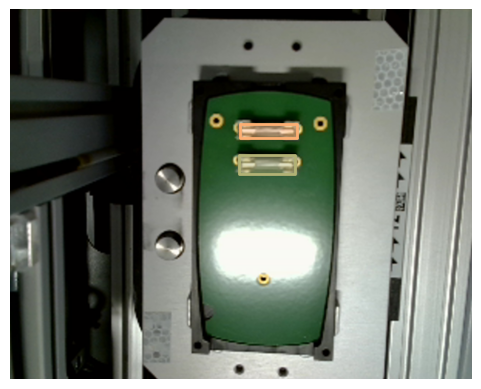

In [7]:
# Create a COCO object
coco = COCO('./data/detection/fuse_dataset_coco.json')

# Get the annotations for this image
annotations = coco.loadAnns(coco.getAnnIds(imgIds=10))

# Get the image info
img_info = coco.loadImgs(10)[0]
height, width = img_info['height'], img_info['width']
file_name = img_info['file_name']
img_path = os.path.join('./data/detection', file_name)
image = plt.imread(img_path)

# Load and display instance annotations
plt.imshow(image); plt.axis('off')
coco.showAnns(annotations, draw_bbox=True)
plt.show()

## Model training

In [8]:
# Load a YOLOv8 model for pose estimation
model = YOLO('yolov8n-cls.yaml').load('yolov8n-cls.pt')  # build from YAML and transfer weights

# Training params
epochs = 50 # All data is sent 'epoch' times through the network
image_size = 640 # All images are resized to this size before entering the network

# Train the model
results = model.train(data='./data/classification', epochs=epochs, imgsz=image_size, save_dir="C:/Users/matth/OneDrive - KU Leuven/Python_Projects/fuse_detection/data")

YOLOv8n-cls summary: 99 layers, 2719288 parameters, 2719288 gradients, 4.4 GFLOPs
Transferred 158/158 items from pretrained weights
Ultralytics YOLOv8.1.14 🚀 Python-3.10.11 torch-2.1.1+cu121 CUDA:0 (NVIDIA RTX A500 Laptop GPU, 4096MiB)
engine\trainer: task=classify, mode=train, model=yolov8n-cls.yaml, data=./data/classification, epochs=50, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, r

train: Scanning C:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\classification\train... 36 images, 0 corrupt: 100%|██████████| 36/36 [00:00<?, ?it/s]
val: Scanning C:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\classification\val... 36 images, 0 corrupt: 100%|██████████| 36/36 [00:00<?, ?it/s]


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 26 weight(decay=0.0), 27 weight(decay=0.0005), 27 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to ..\runs\classify\train
Starting training for 50 epochs...

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:05<00:00,  2.51s/it]

                   all      0.278      0.722



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.98it/s]

                   all      0.361      0.722



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.81it/s]

                   all      0.306       0.75



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 18.05it/s]

                   all      0.306      0.833



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s]

                   all      0.333      0.889



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s]

                   all      0.333      0.889



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s]

                   all      0.361      0.889



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.70it/s]

                   all      0.417      0.861



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.80it/s]

                   all        0.5      0.944



      Epoch    GPU_mem       loss  Instances       Size


      10/50      1.47G      1.734          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.11it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.66it/s]

                   all      0.556      0.944



      Epoch    GPU_mem       loss  Instances       Size


      11/50      1.47G       1.73          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.25it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.22it/s]

                   all      0.528      0.972



      Epoch    GPU_mem       loss  Instances       Size


      12/50      1.47G       1.63          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.03it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.13it/s]

                   all      0.583      0.972



      Epoch    GPU_mem       loss  Instances       Size


      13/50      1.47G      1.628          4        640: 100%|██████████| 3/3 [00:00<00:00,  8.47it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 15.30it/s]

                   all      0.583      0.972



      Epoch    GPU_mem       loss  Instances       Size


      14/50      1.47G      1.566          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.07it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.42it/s]

                   all      0.639      0.972



      Epoch    GPU_mem       loss  Instances       Size


      15/50      1.47G      1.561          4        640: 100%|██████████| 3/3 [00:00<00:00,  7.39it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 19.02it/s]

                   all      0.722          1



      Epoch    GPU_mem       loss  Instances       Size


      16/50      1.46G      1.558          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.13it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s]

                   all      0.667          1



      Epoch    GPU_mem       loss  Instances       Size


      17/50      1.47G       1.44          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.06it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.85it/s]

                   all      0.694          1



      Epoch    GPU_mem       loss  Instances       Size


      18/50      1.47G      1.326          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.02it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s]

                   all      0.722          1



      Epoch    GPU_mem       loss  Instances       Size


      19/50      1.47G      1.425          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.75it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 18.20it/s]


                   all       0.75          1

      Epoch    GPU_mem       loss  Instances       Size


      20/50      1.47G      1.312          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.68it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.76it/s]

                   all      0.694          1



      Epoch    GPU_mem       loss  Instances       Size


      21/50      1.47G      1.291          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.73it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.49it/s]

                   all      0.694          1



      Epoch    GPU_mem       loss  Instances       Size


      22/50      1.47G      1.315          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.68it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.48it/s]

                   all      0.694          1



      Epoch    GPU_mem       loss  Instances       Size


      23/50      1.47G      1.221          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.86it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.57it/s]

                   all      0.722          1



      Epoch    GPU_mem       loss  Instances       Size


      24/50      1.47G      1.162          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.00it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.74it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      25/50      1.47G       1.04          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.85it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.66it/s]

                   all      0.694          1



      Epoch    GPU_mem       loss  Instances       Size


      26/50      1.47G      1.245          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.26it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.65it/s]

                   all      0.722          1



      Epoch    GPU_mem       loss  Instances       Size


      27/50      1.47G      1.028          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.72it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.43it/s]

                   all      0.722          1



      Epoch    GPU_mem       loss  Instances       Size


      28/50      1.47G      1.045          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.81it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.64it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      29/50      1.47G     0.8459          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.55it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.18it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      30/50      1.46G     0.9057          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.96it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.17it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      31/50      1.46G     0.9346          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.77it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 15.16it/s]

                   all      0.778          1



      Epoch    GPU_mem       loss  Instances       Size


      32/50      1.46G     0.9032          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.09it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.16it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      33/50      1.47G     0.8873          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.24it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.27it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      34/50      1.46G     0.9211          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.71it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.35it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      35/50      1.46G     0.9508          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.17it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.46it/s]

                   all      0.778          1



      Epoch    GPU_mem       loss  Instances       Size


      36/50      1.46G     0.7806          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.89it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.47it/s]

                   all      0.806          1



      Epoch    GPU_mem       loss  Instances       Size


      37/50      1.47G      0.824          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.47it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.53it/s]

                   all      0.806          1



      Epoch    GPU_mem       loss  Instances       Size


      38/50      1.46G     0.7013          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.96it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.08it/s]

                   all      0.806          1



      Epoch    GPU_mem       loss  Instances       Size


      39/50      1.46G     0.7826          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.96it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.82it/s]

                   all      0.806          1



      Epoch    GPU_mem       loss  Instances       Size


      40/50      1.46G      1.009          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.14it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.67it/s]

                   all      0.778          1



      Epoch    GPU_mem       loss  Instances       Size


      41/50      1.47G     0.8593          4        640: 100%|██████████| 3/3 [00:12<00:00,  4.26s/it]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.36it/s]

                   all      0.778          1



      Epoch    GPU_mem       loss  Instances       Size


      42/50      1.46G     0.7737          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.59it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 18.30it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      43/50      1.46G     0.8625          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.16it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.93it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      44/50      1.46G     0.8171          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.16it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 14.85it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      45/50      1.47G       0.69          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.17it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.34it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      46/50      1.46G       0.79          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.57it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.68it/s]


                   all       0.75          1

      Epoch    GPU_mem       loss  Instances       Size


      47/50      1.46G     0.9039          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.59it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.99it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


      48/50      1.46G      1.003          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.85it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.61it/s]


                   all       0.75          1

      Epoch    GPU_mem       loss  Instances       Size


      49/50      1.47G     0.6995          4        640: 100%|██████████| 3/3 [00:00<00:00, 10.41it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 18.06it/s]


                   all       0.75          1

      Epoch    GPU_mem       loss  Instances       Size


      50/50      1.46G     0.6952          4        640: 100%|██████████| 3/3 [00:00<00:00,  9.74it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 17.24it/s]

                   all       0.75          1



50 epochs completed in 0.020 hours.
Optimizer stripped from ..\runs\classify\train\weights\last.pt, 3.0MB
Optimizer stripped from ..\runs\classify\train\weights\best.pt, 3.0MB

Validating ..\runs\classify\train\weights\best.pt...
Ultralytics YOLOv8.1.14 🚀 Python-3.10.11 torch-2.1.1+cu121 CUDA:0 (NVIDIA RTX A500 Laptop GPU, 4096MiB)
YOLOv8n-cls summary (fused): 73 layers, 1443847 parameters, 0 gradients, 3.3 GFLOPs
train: C:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\classification\train... found 36 images in 7 classes ✅ 
val: C:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\classification\val... found 36 images in 7 classes ✅ 
test: None...


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.18it/s]


                   all      0.806          1
Speed: 0.9ms preprocess, 1.8ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to ..\runs\classify\train
Results saved to ..\runs\classify\train


## Model validation

In [12]:
# Load a pretrained YOLOv8n model
model = YOLO('../runs/classify/train/weights/best.pt')

In [10]:
# Validate the model
metrics = model.val()

Ultralytics YOLOv8.1.14 🚀 Python-3.10.11 torch-2.1.1+cu121 CUDA:0 (NVIDIA RTX A500 Laptop GPU, 4096MiB)
YOLOv8n-cls summary (fused): 73 layers, 1443847 parameters, 0 gradients, 3.3 GFLOPs
train: C:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\classification\train... found 36 images in 7 classes ✅ 
val: C:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\classification\val... found 36 images in 7 classes ✅ 
test: None...


val: Scanning C:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\classification\val... 36 images, 0 corrupt: 100%|██████████| 36/36 [00:00<?, ?it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 3/3 [00:12<00:00,  4.18s/it]


                   all      0.806          1
Speed: 2.5ms preprocess, 25.5ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to ..\runs\classify\val


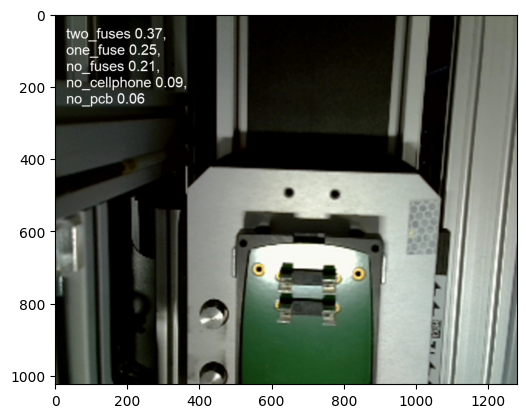

image 1/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 1.jpg: 640x640 two_fuses 0.37, one_fuse 0.25, no_fuses 0.21, no_cellphone 0.09, no_pcb 0.06, 6.2ms


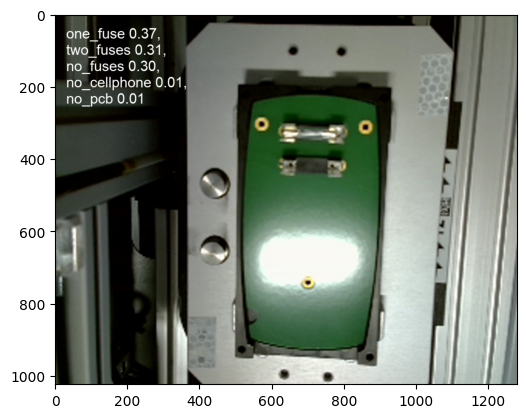

image 2/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 10.jpg: 640x640 one_fuse 0.37, two_fuses 0.31, no_fuses 0.30, no_cellphone 0.01, no_pcb 0.01, 8.3ms


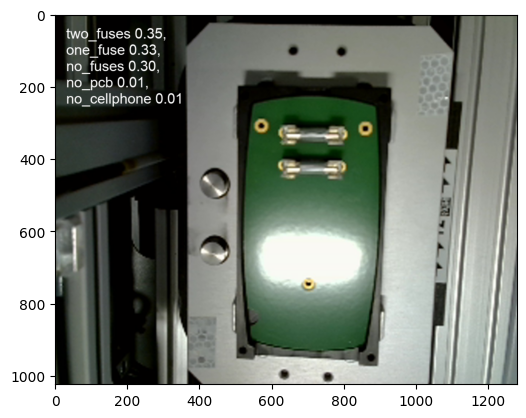

image 3/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 11.jpg: 640x640 two_fuses 0.35, one_fuse 0.33, no_fuses 0.30, no_pcb 0.01, no_cellphone 0.01, 8.5ms


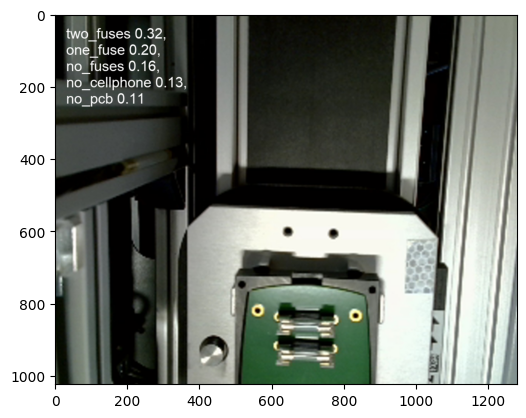

image 4/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 12.jpg: 640x640 two_fuses 0.32, one_fuse 0.20, no_fuses 0.16, no_cellphone 0.13, no_pcb 0.11, 8.5ms


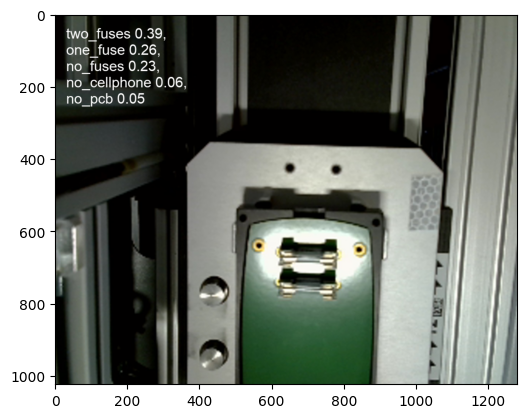

image 5/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 13.jpg: 640x640 two_fuses 0.39, one_fuse 0.26, no_fuses 0.23, no_cellphone 0.06, no_pcb 0.05, 9.7ms


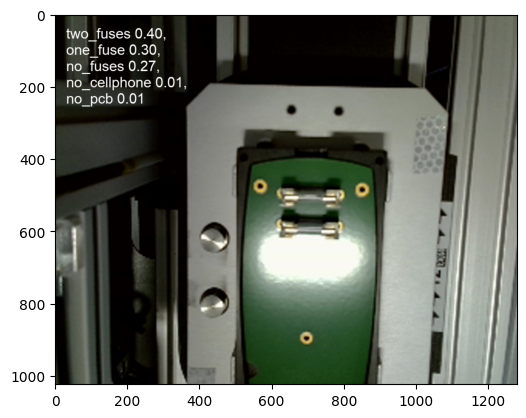

image 6/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 14.jpg: 640x640 two_fuses 0.40, one_fuse 0.30, no_fuses 0.27, no_cellphone 0.01, no_pcb 0.01, 35.2ms


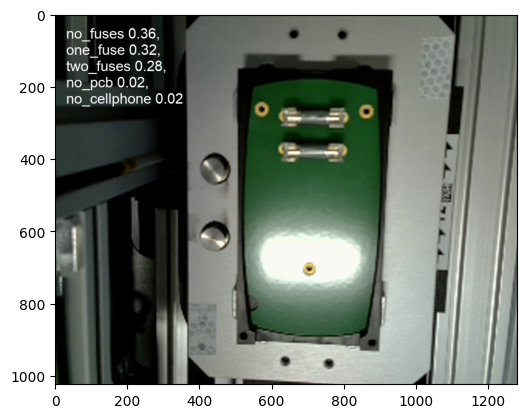

image 7/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 15.jpg: 640x640 no_fuses 0.36, one_fuse 0.32, two_fuses 0.28, no_pcb 0.02, no_cellphone 0.02, 34.2ms


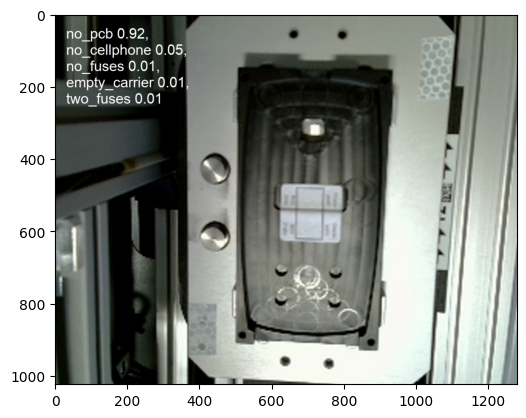

image 8/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 16.jpg: 640x640 no_pcb 0.92, no_cellphone 0.05, no_fuses 0.01, empty_carrier 0.01, two_fuses 0.01, 38.1ms


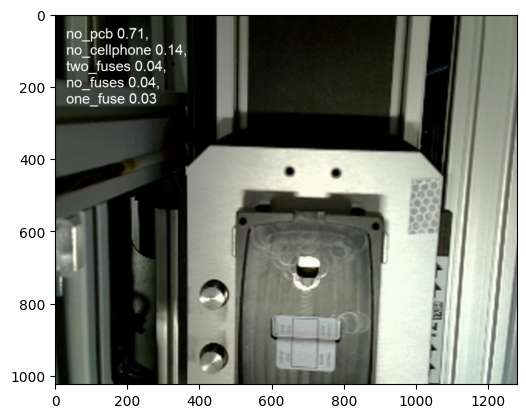

image 9/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 17.jpg: 640x640 no_pcb 0.71, no_cellphone 0.14, two_fuses 0.04, no_fuses 0.04, one_fuse 0.03, 34.4ms


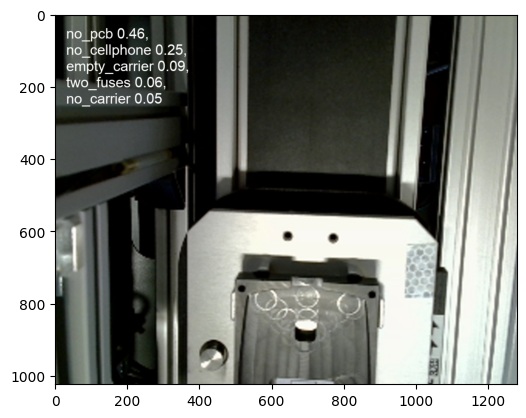

image 10/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 18.jpg: 640x640 no_pcb 0.46, no_cellphone 0.25, empty_carrier 0.09, two_fuses 0.06, no_carrier 0.05, 34.1ms


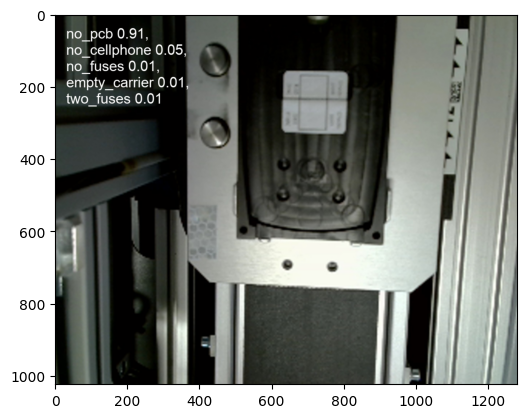

image 11/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 19.jpg: 640x640 no_pcb 0.91, no_cellphone 0.05, no_fuses 0.01, empty_carrier 0.01, two_fuses 0.01, 35.0ms


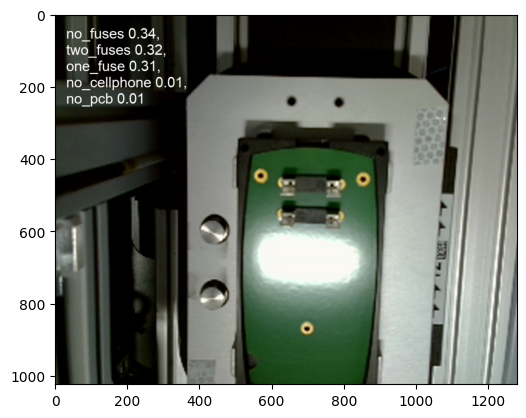

image 12/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 2.jpg: 640x640 no_fuses 0.34, two_fuses 0.32, one_fuse 0.31, no_cellphone 0.01, no_pcb 0.01, 35.2ms


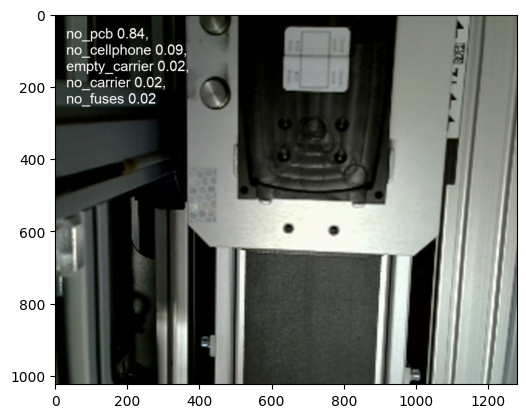

image 13/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 20.jpg: 640x640 no_pcb 0.84, no_cellphone 0.09, empty_carrier 0.02, no_carrier 0.02, no_fuses 0.02, 39.5ms


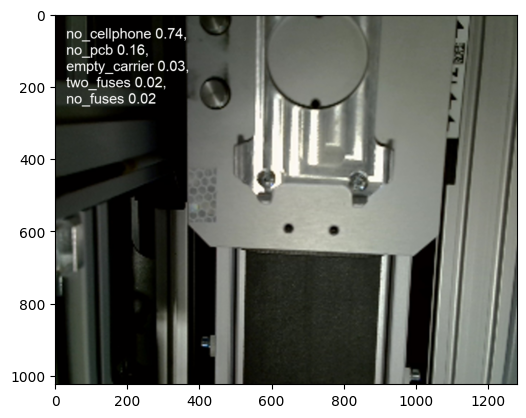

image 14/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 21.jpg: 640x640 no_cellphone 0.74, no_pcb 0.16, empty_carrier 0.03, two_fuses 0.02, no_fuses 0.02, 34.3ms


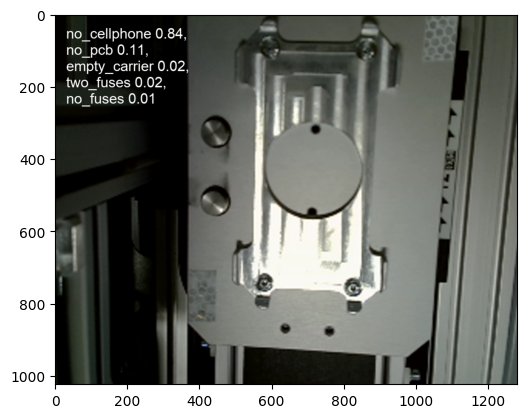

image 15/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 22.jpg: 640x640 no_cellphone 0.84, no_pcb 0.11, empty_carrier 0.02, two_fuses 0.02, no_fuses 0.01, 81.1ms


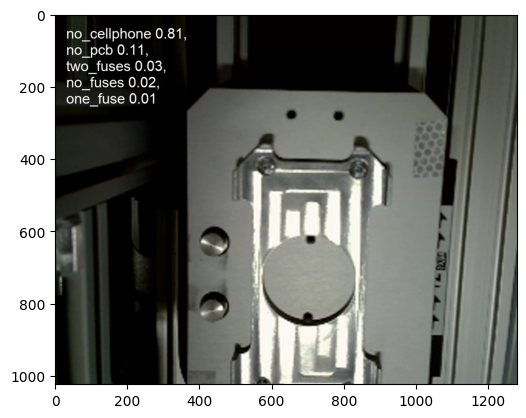

image 16/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 23.jpg: 640x640 no_cellphone 0.81, no_pcb 0.11, two_fuses 0.03, no_fuses 0.02, one_fuse 0.01, 80.0ms


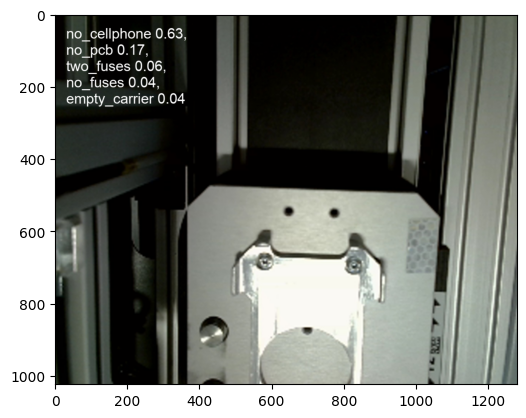

image 17/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 24.jpg: 640x640 no_cellphone 0.63, no_pcb 0.17, two_fuses 0.06, no_fuses 0.04, empty_carrier 0.04, 81.3ms


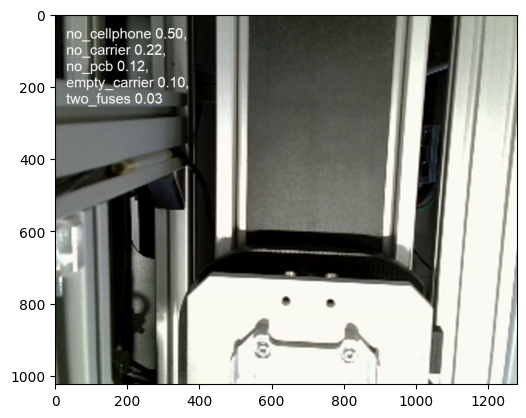

image 18/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 25.jpg: 640x640 no_cellphone 0.50, no_carrier 0.22, no_pcb 0.12, empty_carrier 0.10, two_fuses 0.03, 80.0ms


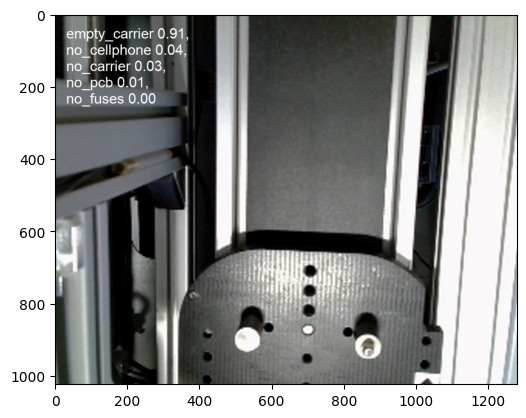

image 19/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 26.jpg: 640x640 empty_carrier 0.91, no_cellphone 0.04, no_carrier 0.03, no_pcb 0.01, no_fuses 0.00, 79.6ms


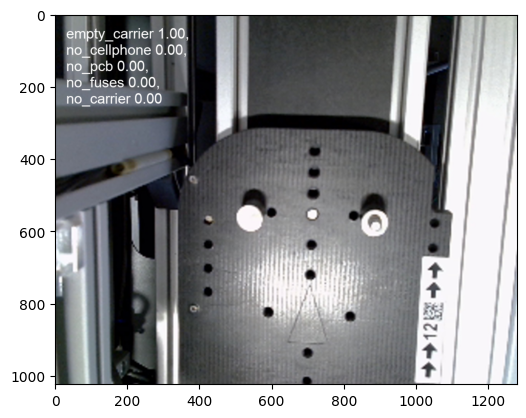

image 20/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 27.jpg: 640x640 empty_carrier 1.00, no_cellphone 0.00, no_pcb 0.00, no_fuses 0.00, no_carrier 0.00, 79.5ms


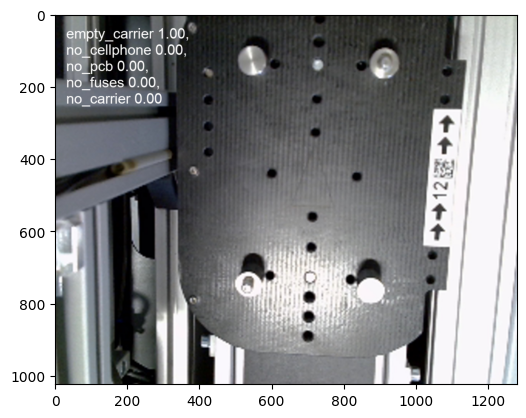

image 21/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 28.jpg: 640x640 empty_carrier 1.00, no_cellphone 0.00, no_pcb 0.00, no_fuses 0.00, no_carrier 0.00, 79.9ms


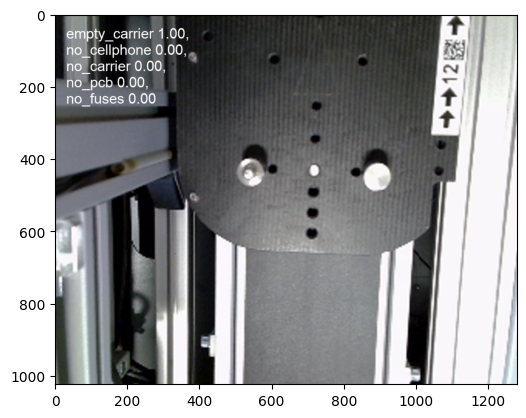

image 22/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 29.jpg: 640x640 empty_carrier 1.00, no_cellphone 0.00, no_carrier 0.00, no_pcb 0.00, no_fuses 0.00, 81.5ms


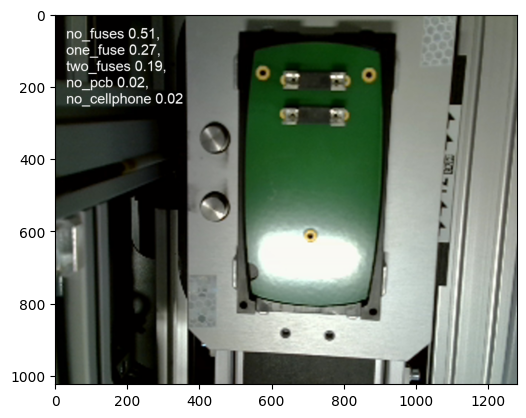

image 23/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 3.jpg: 640x640 no_fuses 0.51, one_fuse 0.27, two_fuses 0.19, no_pcb 0.02, no_cellphone 0.02, 79.0ms


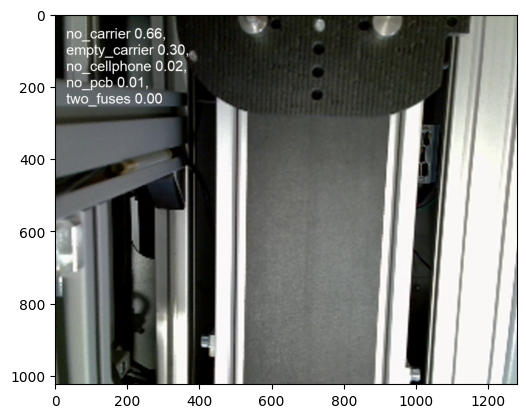

image 24/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 30.jpg: 640x640 no_carrier 0.66, empty_carrier 0.30, no_cellphone 0.02, no_pcb 0.01, two_fuses 0.00, 84.5ms


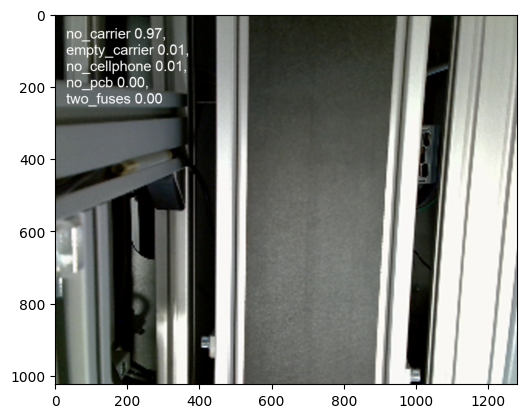

image 25/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 31.jpg: 640x640 no_carrier 0.97, empty_carrier 0.01, no_cellphone 0.01, no_pcb 0.00, two_fuses 0.00, 82.5ms


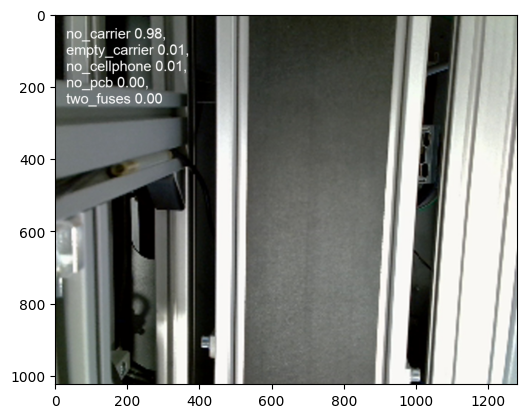

image 26/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 32.jpg: 640x640 no_carrier 0.98, empty_carrier 0.01, no_cellphone 0.01, no_pcb 0.00, two_fuses 0.00, 80.6ms


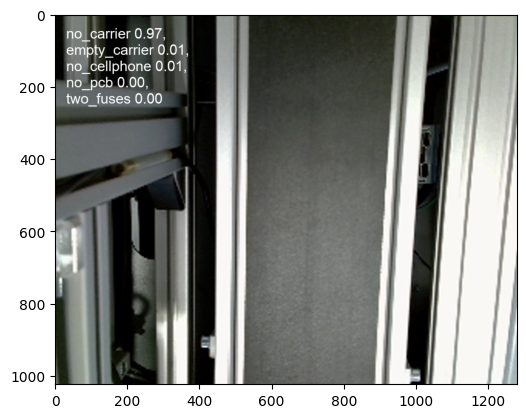

image 27/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 33.jpg: 640x640 no_carrier 0.97, empty_carrier 0.01, no_cellphone 0.01, no_pcb 0.00, two_fuses 0.00, 79.8ms


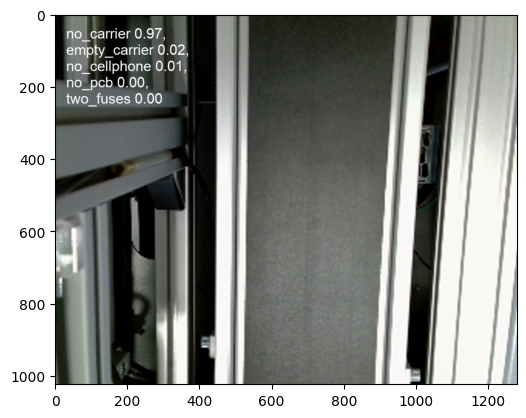

image 28/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 34.jpg: 640x640 no_carrier 0.97, empty_carrier 0.02, no_cellphone 0.01, no_pcb 0.00, two_fuses 0.00, 78.6ms


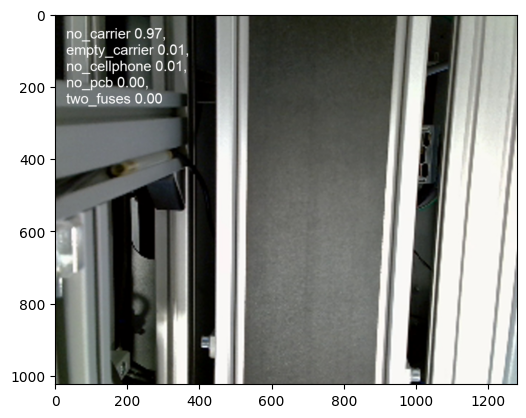

image 29/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 35.jpg: 640x640 no_carrier 0.97, empty_carrier 0.01, no_cellphone 0.01, no_pcb 0.00, two_fuses 0.00, 79.7ms


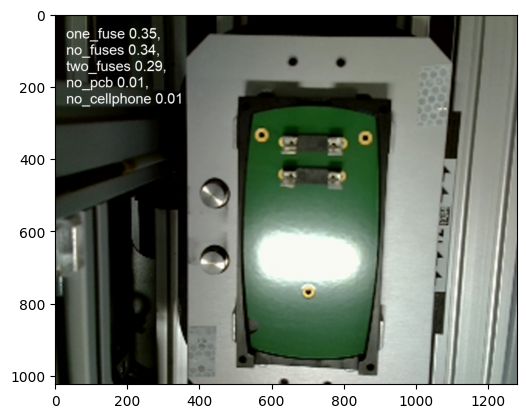

image 30/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 4.jpg: 640x640 one_fuse 0.35, no_fuses 0.34, two_fuses 0.29, no_pcb 0.01, no_cellphone 0.01, 80.5ms


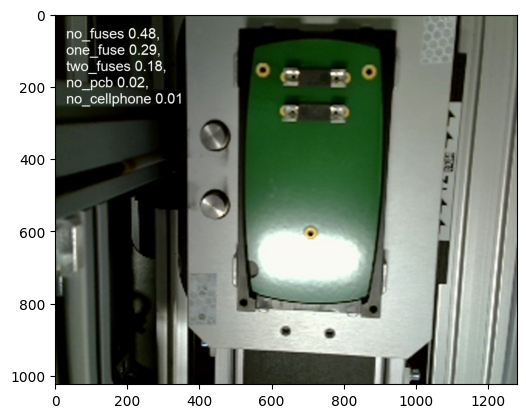

image 31/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 5.jpg: 640x640 no_fuses 0.48, one_fuse 0.29, two_fuses 0.18, no_pcb 0.02, no_cellphone 0.01, 77.6ms


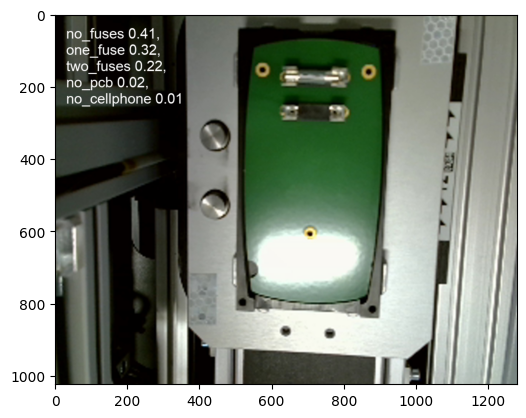

image 32/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 6.jpg: 640x640 no_fuses 0.41, one_fuse 0.32, two_fuses 0.22, no_pcb 0.02, no_cellphone 0.01, 81.3ms


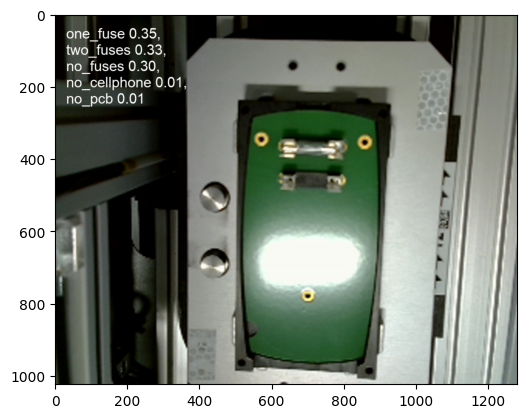

image 33/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 7.jpg: 640x640 one_fuse 0.35, two_fuses 0.33, no_fuses 0.30, no_cellphone 0.01, no_pcb 0.01, 80.7ms


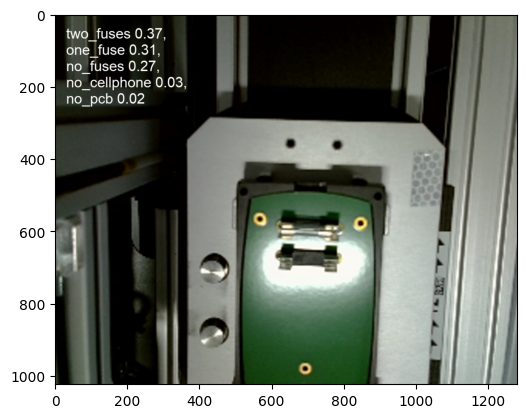

image 34/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 8.jpg: 640x640 two_fuses 0.37, one_fuse 0.31, no_fuses 0.27, no_cellphone 0.03, no_pcb 0.02, 77.6ms


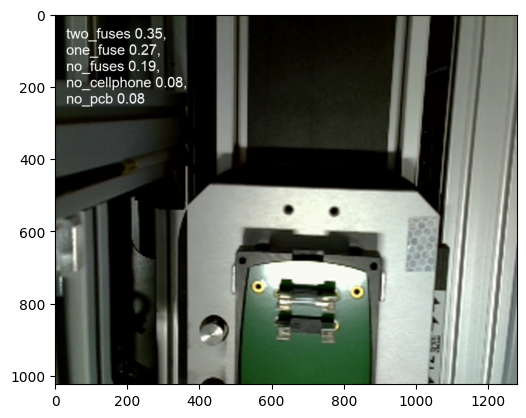

image 35/35 c:\Users\matth\OneDrive - KU Leuven\Python_Projects\fuse_detection\data\images_raw\Picture 9.jpg: 640x640 two_fuses 0.35, one_fuse 0.27, no_fuses 0.19, no_cellphone 0.08, no_pcb 0.08, 73.7ms
Speed: 23.6ms preprocess, 58.3ms inference, 0.1ms postprocess per image at shape (1, 3, 640, 640)


In [11]:
# Predict with the model
results = model('./data/images_raw', stream=True)  # predict on an image

# Plot results
for r in results:
    im_array = r.plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    plt.imshow(im)
    plt.show()